In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle, csv
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split


In [ ]:
# installing lime library
!pip install lime

In [ ]:
# import Explainer function from lime_tabular module of lime library
from lime.lime_tabular import LimeTabularExplainer

In [ ]:
# Solving version incompatibity issues with XGBoost and SKLearn
#!pip uninstall -y scikit-learn
!pip install scikit-learn==1.5.2  # Install and Restart session and run all

In [ ]:
#import xgboost
!pip install xgboost

## Load Data Sets

In [57]:
# load the train set
data = pd.read_pickle('/content/drive/MyDrive/Bigmart_Outlet_Item_Sales_Predictions_n/train_pkl_data_np_null_encoded_mixed.csv')

In [59]:
data[:3]

,Outlet_Identifier_OUT010,Outlet_Identifier_OUT013,Outlet_Identifier_OUT017,Outlet_Identifier_OUT018,Outlet_Identifier_OUT019,Outlet_Identifier_OUT027,Outlet_Identifier_OUT035,Outlet_Identifier_OUT045,Outlet_Identifier_OUT046,Outlet_Identifier_OUT049,...,Outlet_Establishment_Year_2004,Outlet_Establishment_Year_2007,Outlet_Establishment_Year_2009,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.016047,4,249.8092,0,1,3735.1380
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.019278,14,48.2692,2,2,443.4228
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.016760,10,141.6180,0,1,2097.2700


In [ ]:
# load the test set
X_unseen_test = pd.read_pickle('/content/drive/MyDrive/Bigmart_Outlet_Item_Sales_Predictions_n/test_pkl_data_test_np_null_encoded_mixed.csv')


In [74]:
X_unseen_test.head()

,Outlet_Identifier_OUT010,Outlet_Identifier_OUT013,Outlet_Identifier_OUT017,Outlet_Identifier_OUT018,Outlet_Identifier_OUT019,Outlet_Identifier_OUT027,Outlet_Identifier_OUT035,Outlet_Identifier_OUT045,Outlet_Identifier_OUT046,Outlet_Identifier_OUT049,...,Outlet_Establishment_Year_2002,Outlet_Establishment_Year_2004,Outlet_Establishment_Year_2007,Outlet_Establishment_Year_2009,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Location_Type,Outlet_Type
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.007565,13,107.8622,0,1
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.038428,4,87.3198,1,1
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.099575,11,241.7538,2,0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.015388,13,155.0340,1,1
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.118599,4,234.2300,2,3


## Seperate Independent and Dependent Variables

In [ ]:
# Seperating the Independent and Dependent Variables.
X = data.drop('Item_Outlet_Sales', axis=1)
y = data['Item_Outlet_Sales']

## Split the Dataset

In [ ]:
# Split the dataset
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.33, random_state=4)


In [ ]:
num_of_test_records = 5681

In [ ]:
X_train = X_train[:num_of_test_records]
y_train = y_train[:num_of_test_records]

In [ ]:

(X_train.shape, y_train.shape), (X_val.shape, y_val.shape)

(((5681, 25), (5681,)), ((2813, 25), (2813,)))

## Complex XGBR model Explainability

In [ ]:
# Import plot tree for XGBoost
from xgboost import plot_tree

In [ ]:
#Initialize the model
xgbr_model = XGBRegressor(gamma = 0.001, learning_rate = 0.05, max_depth = 2, n_estimators = 100, reg_alpha = 1, random_state =4)

In [ ]:
# Fit on the train set
xgbr_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.001, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=4, ...)

In [ ]:
y_val_pred_xgbr = xgbr_model.predict(X_val)
y_val_pred_xgbr.mean()

2173.2

In [60]:
y_val_pred_xgbr[:3]

array([1509.0502 ,  482.34006, 2097.1702 ], dtype=float32)

In [ ]:
# match the test dataset features with X_train
X_unseen_test.drop('Item_identifier', axis=1, inplace=True)

In [ ]:
print(xgbr_model.score(X_train, y_train) ) # trian score
print(xgbr_model.score(X_val, y_val) ) # val score

0.6105238267528323
0.5856926099397011


In [ ]:
#predict over the unseen test data
y_xgbr_model_test_pred = xgbr_model.predict(X_unseen_test)
y_xgbr_model_test_pred.mean()

2188.8804

In [62]:
# view the predicted values on the unseen test data
y_xgbr_model_test_pred[:3]

array([1670.8154, 1412.4078,  803.8881], dtype=float32)

## Complex XGBR Model Built-in Explainability

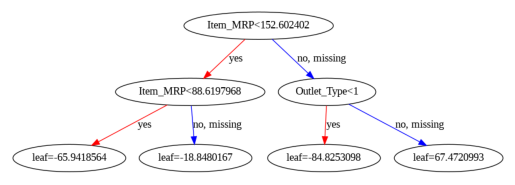

<Figure size 1000x500 with 0 Axes>

In [116]:
# plot single tree
plot_tree(xgbr_model)
plt.figure(figsize=(10,5))
plt.show()

In [117]:
# feature importance of the model
feature_importance_xgb = pd.DataFrame()
feature_importance_xgb['variable'] = X_train.columns
feature_importance_xgb['importance'] = xgbr_model.feature_importances_

In [118]:
# feature_importance values in descending order
feature_importance_xgb.sort_values(by='importance', ascending=False).head()

,variable,importance
24,Outlet_Type,0.412681
22,Item_MRP,0.303885
5,Outlet_Identifier_OUT027,0.239279
3,Outlet_Identifier_OUT018,0.027169
21,Item_Type,0.016985


## Getting LIME and SHAP Libraries

In [ ]:
# Install the Shap library
!pip install shap

In [ ]:
# import shap libraries
import shap

# # Initialize the shap js
shap.initjs()

In [ ]:
# Import libraries
from shap import Explainer

## Complex XGBR Model LIME Explanations

In [63]:
# creating the explainer function
explainer = LimeTabularExplainer(X_train.values, mode="regression", feature_names=X_train.columns)

### Explanation for Test Observation #0

In [64]:
# Copy the test data
X_observation = X_unseen_test

In [75]:
# Now we will use the mean of all observations to see the the model explainability using LIME

# explanation using the model, fit the explainer model and show the explainations and score
explanation = explainer.explain_instance(X_unseen_test.values[0], xgbr_model.predict)
explanation.show_in_notebook(show_table=True, show_all=True)
print(explanation.score)

0.7185949588619431


In [80]:
# Accessing perturbed data for observation #0
perturbed_data = explanation.as_list()
perturbed_data

[('Outlet_Type <= 1.00', -1785.8067989191386),
 ('Outlet_Identifier_OUT027 <= 0.00', -1392.986129116283),
 ('93.71 < Item_MRP <= 142.48', -157.7522029030055),
 ('Outlet_Identifier_OUT018 <= 0.00', 76.45227446036884),
 ('Outlet_Establishment_Year_2007 <= 0.00', 39.50189934187156),
 ('Outlet_Establishment_Year_1998 <= 0.00', -38.65963763368261),
 ('Outlet_Identifier_OUT017 <= 0.00', -34.74855442582813),
 ('Item_Visibility <= 0.03', -31.498685688319934),
 ('Outlet_Identifier_OUT019 <= 0.00', 28.779660071849328),
 ('Outlet_Establishment_Year_1999 > 0.00', -24.035073314190683)]

In [ ]:
# Accessing Feature Weights
for feature, weight in perturbed_data:
    print(feature, weight)

Outlet_Type <= 1.00 -1767.7046312238156
Outlet_Identifier_OUT027 <= 0.00 -1401.11737249467
93.71 < Item_MRP <= 142.48 -157.80777375124234
Outlet_Identifier_OUT018 <= 0.00 94.54874360657942
Outlet_Establishment_Year_1997 <= 0.00 -57.5305923090464
Outlet_Establishment_Year_2007 <= 0.00 47.28667097198636
Outlet_Establishment_Year_1998 <= 0.00 38.00261200095637
Outlet_Identifier_OUT046 <= 0.00 33.562494747821525
Outlet_Identifier_OUT045 <= 0.00 -29.284950592437237
Outlet_Identifier_OUT049 > 0.00 -27.41303717744549


### Explanation for Test Observation # 1

In [83]:
# explanation for observation # 1 using the explainer model
explanation = explainer.explain_instance(X_unseen_test.values[1], lr_model.predict)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


0.5687387081342055


In [84]:
# Accessing perturbed data
perturbed_data = explanation.as_list()
perturbed_data

[('Item_MRP <= 93.71', 41.27475058903365),
 ('Item_Type <= 4.00', 40.89807225345577),
 ('Outlet_Identifier_OUT019 <= 0.00', 27.2587019167761),
 ('Outlet_Establishment_Year_1985 <= 0.00', 22.46917397264902),
 ('Outlet_Identifier_OUT010 <= 0.00', -18.09770695730222),
 ('Outlet_Identifier_OUT018 <= 0.00', 16.42561731922947),
 ('Outlet_Establishment_Year_1999 <= 0.00', -16.356582670005707),
 ('Outlet_Identifier_OUT049 <= 0.00', -16.2068101555399),
 ('Outlet_Establishment_Year_1998 <= 0.00', -14.833474813954679),
 ('Outlet_Establishment_Year_2009 <= 0.00', 14.675735948763442)]

### Explanation for Test Observation #2

In [88]:
# explanation for observation # using the explainer model
explanation = explainer.explain_instance(X_unseen_test.values[2], lr_model.predict)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


0.6823452819316203


In [89]:
perturbed_data = explanation.as_list()
perturbed_data

[('Item_Type > 10.00', -45.3191544715126),
 ('Item_MRP > 186.52', -40.74817027146953),
 ('Outlet_Identifier_OUT019 <= 0.00', 25.38690080504095),
 ('Outlet_Establishment_Year_1985 <= 0.00', 23.169488174804243),
 ('1.00 < Outlet_Location_Type <= 2.00', 19.610571238169097),
 ('Outlet_Establishment_Year_1999 <= 0.00', -18.24258986093065),
 ('Outlet_Identifier_OUT049 <= 0.00', -17.865769188712612),
 ('Outlet_Identifier_OUT018 <= 0.00', 16.86229093200735),
 ('Outlet_Establishment_Year_2009 <= 0.00', 16.776017582107954),
 ('Outlet_Establishment_Year_1998 > 0.00', 15.38490431773825)]

## Complex XGBR Model LIME Explanations Using Surrogate LR Model

### Simple LR Model

In [ ]:
# Initiate Simple LR Model
lr_model = LinearRegression()

In [ ]:
# Fit the simple model using the Train X and the Complex Black Box Model Predicted Predicted values
lr_model.fit(X_train, y_xgbr_model_test_pred)

LinearRegression()

In [ ]:
print(lr_model.score(X_train, y_train) ) # trian score
print(lr_model.score(X_val, y_val) ) # val score

-0.01643008736783491
-0.018091581700588666


In [ ]:
#predict over the unseen test data
y_lr_surr_model_test_pred = lr_model.predict(X_unseen_test)
y_lr_surr_model_test_pred.mean()

2188.81888926094

In [ ]:
# creating the explainer function
explainer = LimeTabularExplainer(X_train.values, mode="regression", feature_names=X_train.columns)

### Explanation for Test Observation #0

In [ ]:
# Copy the test data
X_observation = X_unseen_test

In [106]:
# explanation using the model, fit the explainer model and show the explainations and score
explanation = explainer.explain_instance(X_unseen_test.values[0], lr_model.predict)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


0.46605163872072763


In [107]:
# Accessing perturbed data
perturbed_data = explanation.as_list()
perturbed_data

[('Item_Type > 10.00', -45.25739641743541),
 ('Outlet_Identifier_OUT019 <= 0.00', 29.842884927995883),
 ('Outlet_Establishment_Year_1985 <= 0.00', 26.67154783562539),
 ('Outlet_Location_Type <= 0.00', -21.03046902860195),
 ('Outlet_Establishment_Year_1998 <= 0.00', -17.23043629976845),
 ('Outlet_Identifier_OUT049 > 0.00', 17.115099802897237),
 ('Outlet_Establishment_Year_2009 <= 0.00', 16.685181609852744),
 ('Outlet_Identifier_OUT010 <= 0.00', -16.456334205510124),
 ('Outlet_Establishment_Year_1999 > 0.00', 14.98889857845644),
 ('Outlet_Identifier_OUT018 <= 0.00', 13.71489998906517)]

In [94]:
# Accessing Feature Weights
for feature, weight in perturbed_data:
    print(feature, weight)

Item_Type > 10.00 -43.824076525723946
Outlet_Establishment_Year_1985 <= 0.00 24.707719764704894
Outlet_Identifier_OUT019 <= 0.00 23.405318632730253
Outlet_Location_Type <= 0.00 -20.25931540617766
Outlet_Establishment_Year_1998 <= 0.00 -18.250520287523514
Outlet_Identifier_OUT010 <= 0.00 -17.15767768010171
Outlet_Identifier_OUT049 > 0.00 16.973722036736778
Outlet_Establishment_Year_1999 > 0.00 16.91261720135003
Outlet_Identifier_OUT018 <= 0.00 16.47955088649843
Outlet_Establishment_Year_2009 <= 0.00 15.383888093203463


### Explanation for Test Observation # 1

In [115]:
# explanation for observation # using the explainer model
explanation = explainer.explain_instance(X_unseen_test.values[1], lr_model.predict)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


0.5836793197198918


In [102]:
# Accessing Feature Weights
for feature, weight in perturbed_data:
    print(feature, weight)

Item_Type > 10.00 -43.824076525723946
Outlet_Establishment_Year_1985 <= 0.00 24.707719764704894
Outlet_Identifier_OUT019 <= 0.00 23.405318632730253
Outlet_Location_Type <= 0.00 -20.25931540617766
Outlet_Establishment_Year_1998 <= 0.00 -18.250520287523514
Outlet_Identifier_OUT010 <= 0.00 -17.15767768010171
Outlet_Identifier_OUT049 > 0.00 16.973722036736778
Outlet_Establishment_Year_1999 > 0.00 16.91261720135003
Outlet_Identifier_OUT018 <= 0.00 16.47955088649843
Outlet_Establishment_Year_2009 <= 0.00 15.383888093203463


### Explanation for Test Observation #2

In [98]:
# explanation for observation # using the explainer model
explanation = explainer.explain_instance(X_unseen_test.values[2], lr_model.predict)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


0.6607376401937383


In [99]:
# Accessing Feature Weights
for feature, weight in perturbed_data:
    print(feature, weight)

Item_Type > 10.00 -43.824076525723946
Outlet_Establishment_Year_1985 <= 0.00 24.707719764704894
Outlet_Identifier_OUT019 <= 0.00 23.405318632730253
Outlet_Location_Type <= 0.00 -20.25931540617766
Outlet_Establishment_Year_1998 <= 0.00 -18.250520287523514
Outlet_Identifier_OUT010 <= 0.00 -17.15767768010171
Outlet_Identifier_OUT049 > 0.00 16.973722036736778
Outlet_Establishment_Year_1999 > 0.00 16.91261720135003
Outlet_Identifier_OUT018 <= 0.00 16.47955088649843
Outlet_Establishment_Year_2009 <= 0.00 15.383888093203463


## Complex XGBR Model SHAP Explanations

In [ ]:
# Shap explainer
explainer_shap_xgbr = shap.Explainer(xgbr_model)

In [ ]:
# Generate shap values
shap_values_xgbr = explainer_shap_xgbr.shap_values(X_unseen_test)

In [ ]:
# Shap values generated using Complex XGBR model
shap_values_xgbr

array([[    0.     ,     0.     ,     0.     , ...,  -597.3975 ,
            0.     ,   185.17934],
       [    0.     ,     0.     ,     0.     , ...,  -856.10895,
            0.     ,   178.00291],
       [    0.     ,     0.     ,     0.     , ...,   929.1417 ,
            0.     , -2128.9358 ],
       ...,
       [    0.     ,     0.     ,     0.     , ...,  -352.4709 ,
            0.     ,   209.77438],
       [    0.     ,     0.     ,     0.     , ...,  1083.7423 ,
            0.     ,   282.7812 ],
       [    0.     ,     0.     ,     0.     , ..., -1031.4092 ,
            0.     ,   172.99065]], dtype=float32)

### SHAP Summary Plot using Complex XGBR Model

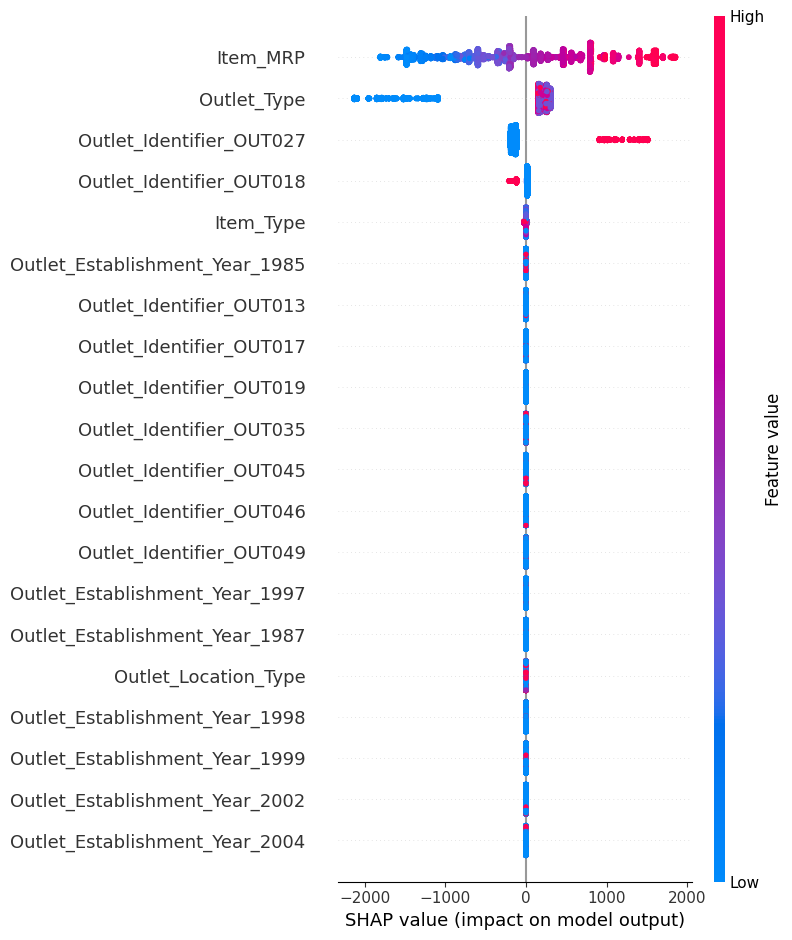

In [ ]:
# Display the summary plot using Shap values
shap.summary_plot(shap_values_xgbr, X_unseen_test)

### SHAP Dependence Plot using Complex XGBR model

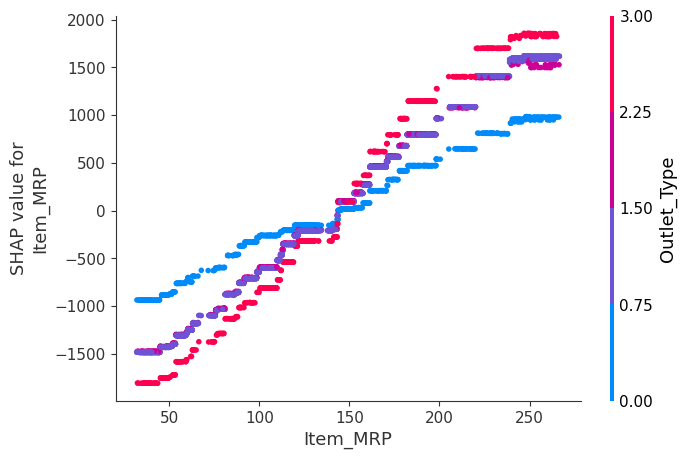

In [ ]:
# Display SHAP dependence plot
shap.dependence_plot("Item_MRP", shap_values_xgbr, X_unseen_test, interaction_index="Outlet_Type")

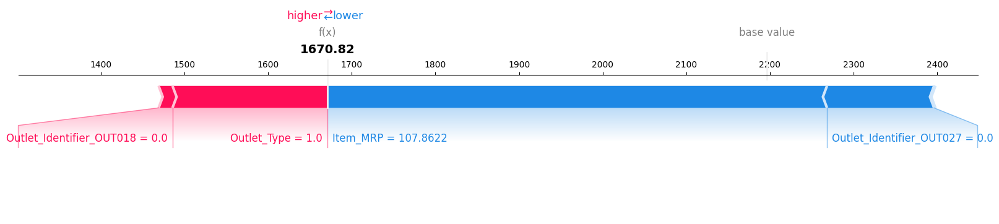

In [ ]:
#Shap force plots
shap.plots.force(explainer_shap_xgbr.expected_value, shap_values_xgbr[0,:], X_unseen_test.iloc[0, :], matplotlib = True)

### SHAP Decision Plot using Complex XGBR Model

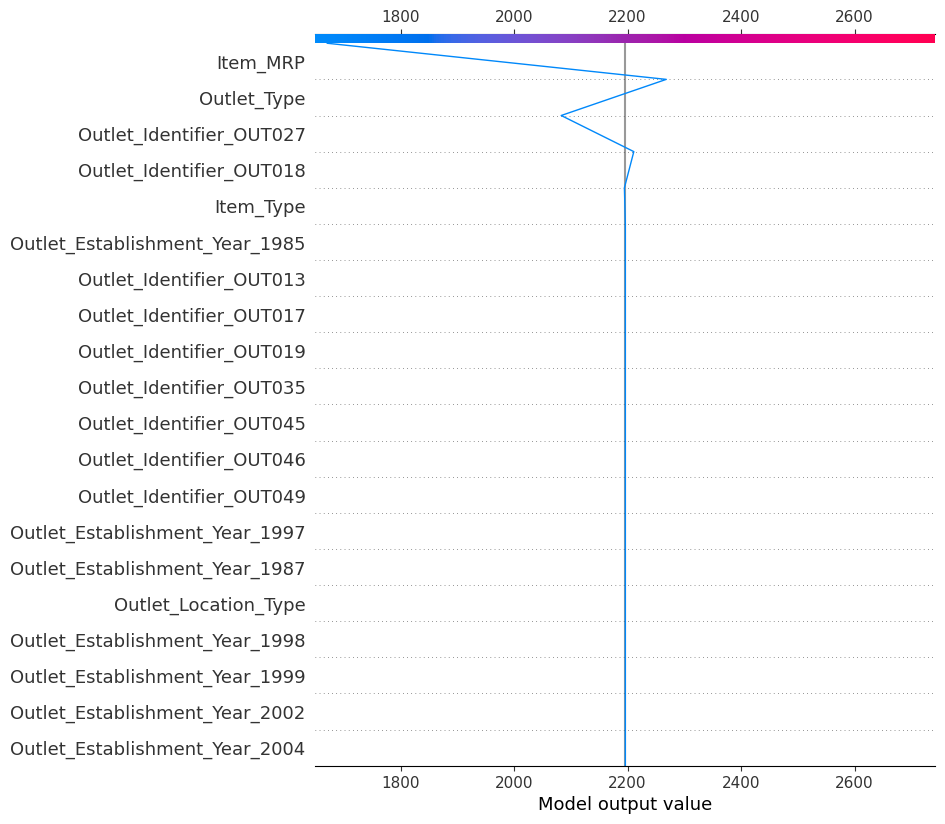

In [53]:
# Shap dependence plot
shap.decision_plot(explainer_shap_xgbr.expected_value, shap_values_xgbr[0,:], X_unseen_test.columns)

### SHAP Force Plot for Complex XGBR Model using SHAP Tree Explainer


In [ ]:
# load JS visualization code to notebook
shap.initjs()

# explain the model's predictions using SHAP values
explainer_shap_xgbr_2 = shap.TreeExplainer(xgbr_model)
shap_values_xgbr_2 = explainer_shap_xgbr_2.shap_values(X_unseen_test)

# visualize the first prediction's explaination
shap.force_plot(explainer_shap_xgbr_2.expected_value, shap_values_xgbr_2[0, :], X_unseen_test.iloc[0, :])

# visualize the training set predictions
shap.force_plot(explainer_shap_xgbr_2.expected_value, shap_values_xgbr_2, X_unseen_test)

/usr/local/lib/python3.10/dist-packages/shap/plots/_force.py:208: UserWarning: shap.plots.force is slow for many thousands of rows, try subsampling your data.
  warnings.warn("shap.plots.force is slow for many thousands of rows, try subsampling your data.")


## Complex XGBR Model(Black Box) SHAP Explanations Using Surrogate LR Model

In [56]:
# Wrap the explainer in function called Explainer and create a SHAP explainer object
explainer_shap = Explainer(lr_model.predict, X_train)
# Generate shap values
shap_values = explainer_shap.shap_values(X_unseen_test)
shap_values[:3]

PermutationExplainer explainer: 5682it [00:57, 81.17it/s]                           


array([[ -1.39871783,  -1.18142755,   0.10309351,   2.1258677 ,
          1.80484345,  -0.19661226,   0.38079174,   0.43288349,
         -0.65139175,  15.59565639,   4.58755804,  -1.18142755,
         -0.65139175,  -1.39871783,  15.59565639,   0.43288349,
          0.38079174,   0.10309351,   2.1258677 ,  -1.07795971,
          1.45049229, -29.46862826,  16.8355796 , -15.93969953,
          0.59509568],
       [ -1.39871783,  -1.18142755,  -2.4742442 ,   2.1258677 ,
          1.80484345,  -0.19661226,   0.38079174,   0.43288349,
         -0.65139175,  -1.73285071,   4.58755804,  -1.18142755,
         -0.65139175,  -1.39871783,  -1.73285071,   0.43288349,
          0.38079174,  -2.4742442 ,   2.1258677 ,   3.06803919,
          0.71412697,  22.84254617,  24.59965123,  -2.43147959,
          0.59509568],
       [ 14.14259142,  -1.18142755,   0.10309351,   2.1258677 ,
          1.80484345,  -0.19661226,   0.38079174,   0.43288349,
         -0.65139175,  -1.73285071,   4.58755804,  -1.1814

### Display SHAP Summary Plot for the Black Box Model using Surrogate LR Model

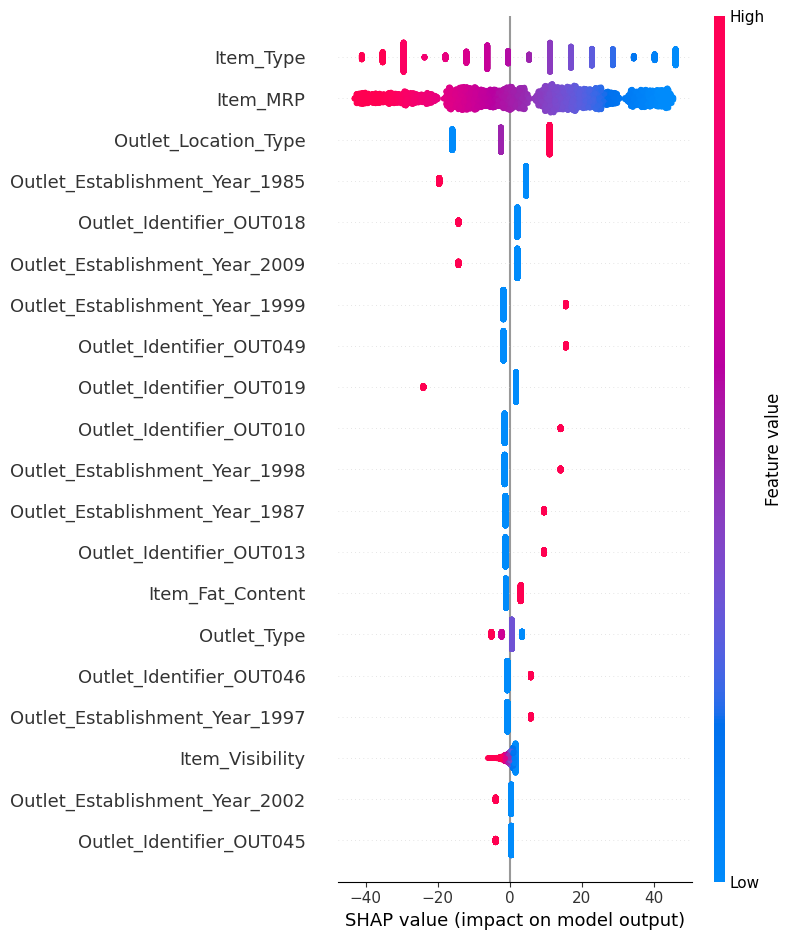

In [54]:
# Display the summary plot using Shap values
shap.summary_plot(shap_values, X_unseen_test)

### SHAP Dependence Plot for Complex XGBR Model(Black Box) using Surrogate Simple LR Model

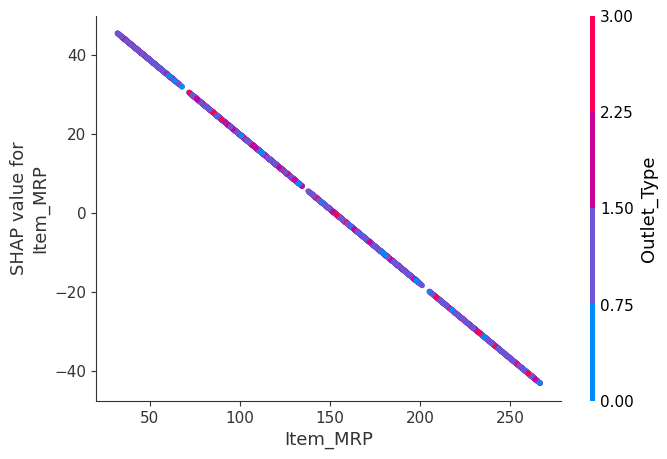

In [55]:
# Display SHAP dependence plot
shap.dependence_plot("Item_MRP", shap_values, X_unseen_test, interaction_index="Outlet_Type")